# Can we trust this prediction? Assessing the risk of using a deep learning algorithm for underwater target detection
by Robbe Van Looy \\
Supervisor: Prof. dr. ir. Aleksandra Pizurica
Counsellors: Nicolas Vercheval, Prof. dr. ir. Nicolas Nadisic, Yoann Arhant

## Data:

The data is contained in 2 zip files (obj.zip and valid.zip). Those two files are first added together in a folder (data_folder). \\
** Note: this file has been created in Google Colab ** \\

The data folder contains jpg-files and txt-files (0001_2015.jpg & 0001_2015.txt) where each jpg-file has a corresponding txt-file. Each txt-file contains the detections of objects (either MILCO or NOMBO) from the jpg-file. \\

Throughout the project we consider these classes: \\
class 0: mine-like contact (MILCO) \\
class 1: non-mine-like bottom object (NOMBO)



# 0. Essential Prerequisites
All the imports of the project all in one place.

In [ ]:
# Access to Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


## 0.1 Dependencies

In [ ]:
# Install LIME
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=3e23a442b07f519304894a13c35787ee6a53e5543d3d16a7642b9d0fa1ac4a02
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [ ]:
!pip install tf-keras-vis

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.5/52.5 kB 3.8 MB/s eta 0:00:00


In [ ]:
# Imports
import cv2
import lime
import lime.lime_image
import numpy as np
import math
import matplotlib.pyplot as plt
import os
import pandas as pd
import random
import re
import shutil
import tensorflow as tf

from PIL import Image, ImageDraw
from skimage.segmentation import mark_boundaries
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input
from tensorflow.keras.preprocessing.image import array_to_img, img_to_array, load_img, apply_affine_transform
from tensorflow.keras.models import load_model, Model, Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Input, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import layers, models, optimizers
from tf_keras_vis.gradcam import Gradcam

# 1. Data loading
This section handles the integration of the data into the project. The data is split up in two zip-files and are uploaded on Google Drive for easy access.

In [ ]:
cd /content/

/content


In [ ]:
!cp /content/gdrive/MyDrive/UGent/2024-2025/MasterThesis/data/obj.zip /content/
!cp /content/gdrive/MyDrive/UGent/2024-2025/MasterThesis/data/valid.zip /content/

In [ ]:
!unzip obj.zip -d ./data
!unzip valid.zip -d ./data

Archive:  obj.zip
   creating: ./data/obj/
  inflating: ./data/obj/0001_2010.jpg  
  inflating: ./data/obj/0001_2010.txt  
  inflating: ./data/obj/0001_2015.jpg  
  inflating: ./data/obj/0001_2015.txt  
  inflating: ./data/obj/0001_2018.jpg  
  inflating: ./data/obj/0001_2018.txt  
  inflating: ./data/obj/0002_2010.jpg  
  inflating: ./data/obj/0002_2010.txt  
  inflating: ./data/obj/0002_2015.jpg  
  inflating: ./data/obj/0002_2015.txt  
  inflating: ./data/obj/0002_2018.jpg  
  inflating: ./data/obj/0002_2018.txt  
  inflating: ./data/obj/0003_2010.jpg  
  inflating: ./data/obj/0003_2010.txt  
  inflating: ./data/obj/0003_2015.jpg  
  inflating: ./data/obj/0003_2015.txt  
  inflating: ./data/obj/0003_2018.jpg  
  inflating: ./data/obj/0003_2018.txt  
  inflating: ./data/obj/0004_2010.jpg  
  inflating: ./data/obj/0004_2010.txt  
  inflating: ./data/obj/0004_2015.jpg  
  inflating: ./data/obj/0004_2015.txt  
  inflating: ./data/obj/0004_2018.jpg  
  inflating: ./data/obj/0004_2018.txt

In [ ]:
!mkdir -p /content/data/all

In [ ]:
!cp -r /content/data/obj/* /content/data/all
!cp -r /content/data/valid/* /content/data/all

In [ ]:
cd /content/data/all

/content/data/all


In [ ]:
# Check the data that is loaded in
!ls

0001_2010.jpg  0047_2021.jpg  0110_2010.jpg  0221_2018.jpg  0338_2018.jpg
0001_2010.txt  0047_2021.txt  0110_2010.txt  0221_2018.txt  0338_2018.txt
0001_2015.jpg  0048_2010.jpg  0110_2015.jpg  0222_2010.jpg  0339_2010.jpg
0001_2015.txt  0048_2010.txt  0110_2015.txt  0222_2010.txt  0339_2010.txt
0001_2017.jpg  0048_2015.jpg  0110_2018.jpg  0222_2018.jpg  0339_2018.jpg
0001_2017.txt  0048_2015.txt  0110_2018.txt  0222_2018.txt  0339_2018.txt
0001_2018.jpg  0048_2017.jpg  0111_2010.jpg  0223_2010.jpg  0340_2010.jpg
0001_2018.txt  0048_2017.txt  0111_2010.txt  0223_2010.txt  0340_2010.txt
0001_2021.jpg  0048_2018.jpg  0111_2015.jpg  0223_2018.jpg  0340_2018.jpg
0001_2021.txt  0048_2018.txt  0111_2015.txt  0223_2018.txt  0340_2018.txt
0002_2010.jpg  0048_2021.jpg  0111_2018.jpg  0224_2010.jpg  0341_2010.jpg
0002_2010.txt  0048_2021.txt  0111_2018.txt  0224_2010.txt  0341_2010.txt
0002_2015.jpg  0049_2010.jpg  0112_2010.jpg  0224_2018.jpg  0341_2018.jpg
0002_2015.txt  0049_2010.txt  0112_201

# 2. Data preprocessing
This section handles basic preprocessing like reduce noise and redundancy in data. This section also allows some basic data exploration.

In [ ]:
# Path to the folder containing images and their corresponding .txt files
data_folder = '/content/data/all'

# Path to the folder containing extracted bounding boxes
output_folder = '/content/data/output'

In [ ]:
# List to store image sizes
image_sizes = []

# Function to calculate actual width and height in pixels from normalized bounding box parameters
def get_pixel_dimensions(bbox, image_width, image_height):
    _, center_x, center_y, norm_width, norm_height = bbox
    width = norm_width * image_width
    height = norm_height * image_height
    return width, height

# Function to print the image size in kilobytes
def print_image_size(image_path):
    size_bytes = os.path.getsize(image_path)
    size_kb = size_bytes / 1024  # Convert to kilobytes
    print(f"File: {os.path.basename(image_path)} -> Size: {size_kb:.2f} KB")

# Function to print every bbox width and height found
def get_sizes_bbox(data_folder):
  for file in os.listdir(data_folder):
      if file.endswith('.jpg'):
          base_filename = os.path.splitext(file)[0]
          txt_file = os.path.join(data_folder, f"{base_filename}.txt")

          image_path = os.path.join(data_folder, file)
          with Image.open(image_path) as img:
              image_width, image_height = img.size

          # Check if the corresponding .txt file exists
          if os.path.exists(txt_file):
              # Read bounding box data from the .txt file
              with open(txt_file, 'r') as f:
                  for line in f:
                      # Parse the normalized bounding box coordinates
                      bbox = list(map(float, line.strip().split()))

                      # Extract class label
                      class_label = int(bbox[0])

                      # Calculate actual width and height in pixels
                      width, height = get_pixel_dimensions(bbox, image_width, image_height)
                      print(f"File: {file} -> Bounding Box Width (pixels): {width:.2f}, Height (pixels): {height:.2f} , CLASS:{class_label}")
          else:
              print(f"Warning: No bounding box file found for image {file}")

# Function to print size of all images
def get_images_size(data_folder):
  for file in os.listdir(data_folder):
      if file.endswith('.jpg'):
          image_path = os.path.join(data_folder, file)
          print_image_size(image_path)

# Function to print the image size and collect sizes in bytes
def collect_image_size(image_path):
    size_bytes = os.path.getsize(image_path)
    size_kb = size_bytes / 1024
    image_sizes.append(size_kb)

# Function to plot overview of data sizes
def plot_data_sizes(data_folder):
  for file in os.listdir(data_folder):
      if file.endswith('.jpg'):
          image_path = os.path.join(data_folder, file)
          collect_image_size(image_path)

  # Plotting the histogram of image sizes
  plt.figure(figsize=(10, 6))
  plt.hist(image_sizes, bins=30, color='blue', alpha=0.7)
  plt.title('Histogram of Image Sizes')
  plt.xlabel('Size (bytes)')
  plt.ylabel('Frequency')
  plt.grid(axis='y', alpha=0.75)
  plt.xlim([0, max(image_sizes)])  # Adjust x-axis limit for better visibility
  plt.show()

def count_images_above_250kb(data_folder):
  count_above_250_kb = 0

  for file in os.listdir(data_folder):
      if file.endswith('.jpg'):
          image_path = os.path.join(data_folder, file)

          # Get the size of the image in kilobytes
          size_kb = os.path.getsize(image_path) / 1024

          # Check if the image size is greater than 250 KB
          if size_kb > 250:
              count_above_250_kb += 1

  print(f"Number of images larger than 250 KB: {count_above_250_kb}")

def extract_images_above_250kb(filtered_folder,data_folder):
  # Create the filtered folder if it does not exist
  if not os.path.exists(filtered_folder):
      os.makedirs(filtered_folder)

  for file in os.listdir(data_folder):
      if file.endswith('.jpg'):
          image_path = os.path.join(data_folder, file)

          # Get the size of the image in kilobytes
          size_kb = os.path.getsize(image_path) / 1024

          if size_kb > 250:
              # Copy the image to the filtered folder
              shutil.copy(image_path, os.path.join(filtered_folder, os.path.basename(image_path)))
              print(f"Copied {file} to filtered folder (size: {size_kb:.2f} KB)")

              txt_file = os.path.join(data_folder, f"{os.path.splitext(file)[0]}.txt")
              if os.path.exists(txt_file):
                  shutil.copy(txt_file, os.path.join(filtered_folder, os.path.basename(txt_file)))
                  print(f"Copied {os.path.basename(txt_file)} to filtered folder")

          else:
              print(f"Keeping {file} (size: {size_kb:.2f} KB)")

# Function that returns the amount of images in a folder
def count_images(data_folder):
  image_count = 0

  for file in os.listdir(data_folder):
      if file.endswith(('.jpg')):
          image_count += 1

  print(f"Total number of images in '{data_folder}': {image_count}")

In [ ]:
get_sizes_bbox(data_folder)

File: 0101_2015.jpg -> Bounding Box Width (pixels): 24.00, Height (pixels): 25.00 , CLASS:1
File: 0275_2018.jpg -> Bounding Box Width (pixels): 24.00, Height (pixels): 13.50 , CLASS:0
File: 0026_2021.jpg -> Bounding Box Width (pixels): 13.00, Height (pixels): 12.00 , CLASS:0
File: 0328_2010.jpg -> Bounding Box Width (pixels): 61.50, Height (pixels): 18.00 , CLASS:1
File: 0329_2018.jpg -> Bounding Box Width (pixels): 8.50, Height (pixels): 8.00 , CLASS:0
File: 0062_2010.jpg -> Bounding Box Width (pixels): 36.00, Height (pixels): 34.00 , CLASS:1
File: 0313_2010.jpg -> Bounding Box Width (pixels): 23.00, Height (pixels): 10.50 , CLASS:1
File: 0436_2018.jpg -> Bounding Box Width (pixels): 21.00, Height (pixels): 13.00 , CLASS:0
File: 0027_2021.jpg -> Bounding Box Width (pixels): 14.50, Height (pixels): 14.50 , CLASS:0
File: 0015_2021.jpg -> Bounding Box Width (pixels): 19.50, Height (pixels): 14.50 , CLASS:0
File: 0316_2010.jpg -> Bounding Box Width (pixels): 23.00, Height (pixels): 10.50 

In [ ]:
get_images_size(data_folder)

File: 0235_2010.jpg -> Size: 33.02 KB
File: 0250_2010.jpg -> Size: 314.16 KB
File: 0214_2010.jpg -> Size: 34.75 KB
File: 0259_2010.jpg -> Size: 33.83 KB
File: 0322_2018.jpg -> Size: 323.62 KB
File: 0240_2018.jpg -> Size: 379.75 KB
File: 0101_2015.jpg -> Size: 274.59 KB
File: 0136_2010.jpg -> Size: 33.87 KB
File: 0274_2018.jpg -> Size: 382.45 KB
File: 0214_2018.jpg -> Size: 51.62 KB
File: 0275_2018.jpg -> Size: 52.32 KB
File: 0031_2017.jpg -> Size: 315.37 KB
File: 0226_2010.jpg -> Size: 33.51 KB
File: 0055_2018.jpg -> Size: 389.42 KB
File: 0046_2017.jpg -> Size: 36.77 KB
File: 0026_2021.jpg -> Size: 36.42 KB
File: 0060_2018.jpg -> Size: 384.22 KB
File: 0328_2010.jpg -> Size: 34.34 KB
File: 0230_2018.jpg -> Size: 51.28 KB
File: 0438_2018.jpg -> Size: 35.58 KB
File: 0150_2010.jpg -> Size: 34.57 KB
File: 0083_2017.jpg -> Size: 41.56 KB
File: 0030_2021.jpg -> Size: 30.71 KB
File: 0298_2010.jpg -> Size: 35.05 KB
File: 0051_2010.jpg -> Size: 322.35 KB
File: 0239_2018.jpg -> Size: 376.02 KB
Fi

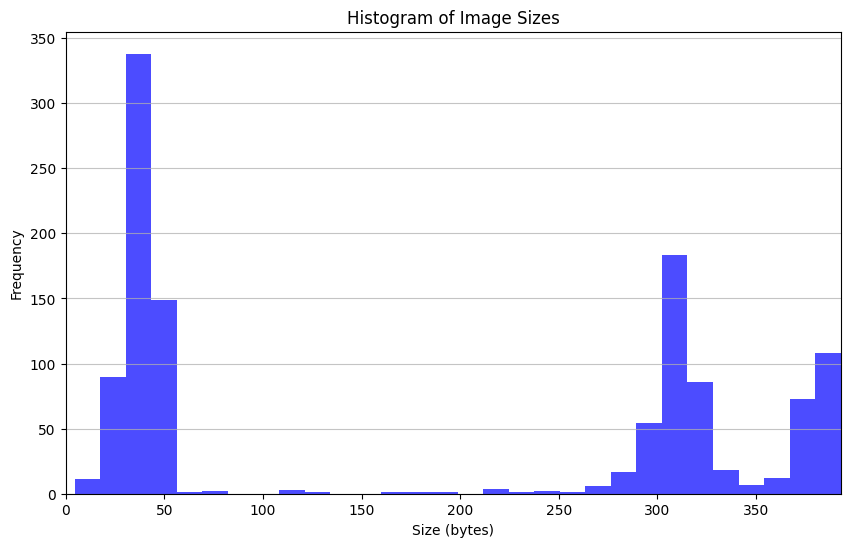

In [ ]:
plot_data_sizes(data_folder) # Check this function for errors!

In [ ]:
count_images_above_250kb(data_folder)

Number of images larger than 250 KB: 565


In [ ]:
count_images(data_folder)

Total number of images in '/content/data/all': 1170


In [ ]:
def count_empty_txt_files(folder_path):
  c = 0

  for file_name in os.listdir(folder_path):
    if file_name.endswith('.txt'):
      file_path = os.path.join(folder_path, file_name)
      if os.path.isfile(file_path) and os.path.getsize(file_path) == 0:
        c += 1
        # print(f"File '{file_name}' is empty.")

  return c

count_empty_txt_files(data_folder)

866

In [ ]:
def print_dimensions_images(folder_path):
  c = 0
  dim_1024 = 0
  dim_416 = 0

  for file_name in os.listdir(folder_path):
    if file_name.endswith('.jpg'):
      print(f"File '{file_name}'")
      file_path = os.path.join(folder_path, file_name)
      image_shape = cv2.imread(file_path).shape
      print(f"Dimensions: {image_shape}")
      if image_shape[0] == 1024 and image_shape[1] == 1024:
        dim_1024 += 1
      if image_shape[0] == 416 and image_shape[1] == 416:
        dim_416 += 1
      c+=1

  print(f"Total number of images: {c}")
  print(f"Images with dimensions 1024x1024: {dim_1024}")
  print(f"Images with dimensions 416x416: {dim_416}")

print_dimensions_images(data_folder)

File '0032_2018.jpg'
Dimensions: (1024, 1024, 3)
File '0045_2010.jpg'
Dimensions: (1024, 1024, 3)
File '0288_2018.jpg'
Dimensions: (416, 416, 3)
File '0132_2010.jpg'
Dimensions: (1024, 1024, 3)
File '0549_2018.jpg'
Dimensions: (416, 416, 3)
File '0378_2018.jpg'
Dimensions: (1024, 1024, 3)
File '0048_2015.jpg'
Dimensions: (416, 416, 3)
File '0016_2010.jpg'
Dimensions: (1024, 1024, 3)
File '0185_2010.jpg'
Dimensions: (416, 416, 3)
File '0059_2017.jpg'
Dimensions: (1024, 1024, 3)
File '0156_2010.jpg'
Dimensions: (1024, 1024, 3)
File '0216_2018.jpg'
Dimensions: (1024, 1024, 3)
File '0235_2018.jpg'
Dimensions: (416, 416, 3)
File '0393_2018.jpg'
Dimensions: (416, 416, 3)
File '0011_2010.jpg'
Dimensions: (416, 416, 3)
File '0505_2018.jpg'
Dimensions: (416, 416, 3)
File '0309_2010.jpg'
Dimensions: (1024, 1024, 3)
File '0504_2018.jpg'
Dimensions: (416, 416, 3)
File '0292_2018.jpg'
Dimensions: (1024, 1024, 3)
File '0285_2010.jpg'
Dimensions: (1024, 1024, 3)
File '0491_2018.jpg'
Dimensions: (416,

In [ ]:
def print_txt_file(file_name,folder_path):
    file_path = os.path.join(folder_path, file_name)
    with open(file_path, 'r') as file:
        for line in file:
            print(line.strip())
    print("-- EOF")

print_txt_file("0003_2010.txt",data_folder)

-- EOF


In [ ]:
def remove_images_without_detections(folder_path):
  for file_name in os.listdir(folder_path):
      if file_name.endswith(".txt"):
        txt_file_path = os.path.join(folder_path, file_name)
        if os.path.isfile(txt_file_path) and os.stat(txt_file_path).st_size == 0:
          jpg_file_name = file_name.replace(".txt",".jpg")
          jpg_file_path = os.path.join(folder_path,jpg_file_name)

          os.remove(txt_file_path)
          print(f"Removed {file_name}")
          if os.path.isfile(jpg_file_path):
            os.remove(jpg_file_path)
            print(f"Removed {jpg_file_name}")

In [ ]:
remove_images_without_detections(data_folder)

Removed 0137_2010.txt
Removed 0137_2010.jpg
Removed 0035_2010.txt
Removed 0035_2010.jpg
Removed 0083_2010.txt
Removed 0083_2010.jpg
Removed 0135_2018.txt
Removed 0135_2018.jpg
Removed 0181_2018.txt
Removed 0181_2018.jpg
Removed 0409_2018.txt
Removed 0409_2018.jpg
Removed 0425_2018.txt
Removed 0425_2018.jpg
Removed 0034_2017.txt
Removed 0034_2017.jpg
Removed 0251_2010.txt
Removed 0251_2010.jpg
Removed 0499_2018.txt
Removed 0499_2018.jpg
Removed 0091_2017.txt
Removed 0091_2017.jpg
Removed 0230_2018.txt
Removed 0230_2018.jpg
Removed 0276_2010.txt
Removed 0276_2010.jpg
Removed 0295_2018.txt
Removed 0295_2018.jpg
Removed 0032_2017.txt
Removed 0032_2017.jpg
Removed 0397_2018.txt
Removed 0397_2018.jpg
Removed 0504_2018.txt
Removed 0504_2018.jpg
Removed 0217_2018.txt
Removed 0217_2018.jpg
Removed 0094_2018.txt
Removed 0094_2018.jpg
Removed 0236_2010.txt
Removed 0236_2010.jpg
Removed 0399_2018.txt
Removed 0399_2018.jpg
Removed 0165_2018.txt
Removed 0165_2018.jpg
Removed 0057_2010.txt
Removed 00

## 2.1. Visualizations


In [ ]:
def show_random_images(folder_path, num_images=20):
    """Display a specified number of random images from a folder."""
    # List all image files in the folder
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg'))]

    # Select a random sample of images
    random_images = random.sample(image_files, min(num_images, len(image_files)))

    # Dynamically determine grid size based on the number of images
    cols = 5  # number of columns
    rows = math.ceil(len(random_images) / cols)

    # Set up the plot grid
    plt.figure(figsize=(15, rows * 3))
    for i, image_file in enumerate(random_images):
        image_path = os.path.join(folder_path, image_file)
        with Image.open(image_path) as img:
            # Display each image in the grid
            ax = plt.subplot(rows, cols, i + 1)
            ax.imshow(img)
            ax.axis('off')  # Hide axes for better visualization
            ax.set_title(image_file)
            ax.set_aspect('auto')  # Ensure the image retains its aspect ratio
    plt.tight_layout()
    plt.show()

In [ ]:
def visualize_bounding_boxes_with_padding(image_path, txt_path, crop_size=299, padding=150):
    if not os.path.isfile(image_path):
        print(f"Image file not found: {image_path}")
        return

    image = cv2.imread(image_path)
    if image is None:
        print(f"Unable to load image: {image_path}")
        return

    # Add padding to the image
    padded_image = cv2.copyMakeBorder(image, padding, padding, padding, padding, cv2.BORDER_CONSTANT, value=[0, 0, 0])
    padded_height, padded_width, _ = padded_image.shape

    detections = []

    with open(txt_path, 'r') as file:
        for idx, line in enumerate(file.readlines()):
            values = line.strip().split()
            if len(values) != 5:
                print(f"Found different parameters in {txt_path}")
                continue

            class_id, x, y, w, h = map(float, values)
            class_id = int(class_id)

            center_x = int(x * padded_width)
            center_y = int(y * padded_height)
            box_w = int(w * padded_width)
            box_h = int(h * padded_height)

            half_size = crop_size // 2
            x_min = max(center_x - half_size, 0)
            x_max = min(center_x + half_size, padded_width)
            y_min = max(center_y - half_size, 0)
            y_max = min(center_y + half_size, padded_height)

            detections.append((x_min, y_min, x_max, y_max, idx, class_id))

    filtered_detections = []
    for det in detections:
        x_min, y_min, x_max, y_max, idx, class_id = det
        overlap = False
        for f_det in filtered_detections:
            fx_min, fy_min, fx_max, fy_max, _, _ = f_det
            if not (x_max < fx_min or x_min > fx_max or y_max < fy_min or y_min > fy_max):
                overlap = True
                break
        if not overlap:
            filtered_detections.append(det)

    for det in detections:
        x_min, y_min, x_max, y_max, idx, class_id = det
        color = (0, 255, 0) if det in filtered_detections else (0, 0, 255)
        cv2.rectangle(padded_image, (x_min, y_min), (x_max, y_max), color, 2)
        cv2.putText(padded_image, str(class_id), (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)

    # Convert BGR image to RGB for matplotlib
    image_rgb = cv2.cvtColor(padded_image, cv2.COLOR_BGR2RGB)

    # Extract image name from image_path
    image_name = os.path.basename(image_path)

    # Display the image with bounding boxes
    plt.figure(figsize=(10, 10))
    plt.imshow(image_rgb)
    plt.title(f"{image_name}")
    plt.axis('off')
    plt.show()


In [ ]:
def visualize_bounding_boxes_with_replicate_padding(image_path, txt_path, crop_size=299, padding=150, iou_threshold=0.1):
    if not os.path.isfile(image_path):
        print(f"Image file not found: {image_path}")
        return

    image = cv2.imread(image_path)
    if image is None:
        print(f"Unable to load image: {image_path}")
        return

    height, width, _ = image.shape

    # Add replicate padding to the image
    padded_image = cv2.copyMakeBorder(image, padding, padding, padding, padding, cv2.BORDER_REFLECT)
    padded_height, padded_width, _ = padded_image.shape

    detections = []

    with open(txt_path, 'r') as file:
        for idx, line in enumerate(file.readlines()):
            values = line.strip().split()
            if len(values) != 5:
                print(f"Found different parameters in {txt_path}")
                continue

            class_id, x, y, w, h = map(float, values)
            class_id = int(class_id)

            center_x = int(x * width) + padding
            center_y = int(y * height) + padding
            box_w = int(w * width)
            box_h = int(h * height)

            half_size = crop_size // 2
            x_min = max(center_x - half_size, 0)
            x_max = min(center_x + half_size, padded_width)
            y_min = max(center_y - half_size, 0)
            y_max = min(center_y + half_size, padded_height)

            detections.append((x_min, y_min, x_max, y_max, idx, class_id))

    filtered_detections = []
    for det in detections:
        x_min, y_min, x_max, y_max, idx, class_id = det
        overlap = False
        for f_det in filtered_detections:
            fx_min, fy_min, fx_max, fy_max, _, _ = f_det
            iou = calculate_iou((x_min,y_min,x_max,y_max),(fx_min,fy_min,fx_max,fy_max))
            if iou > iou_threshold:
                overlap = True
                break
        if not overlap:
            filtered_detections.append(det)

    for det in detections:
        x_min, y_min, x_max, y_max, idx, class_id = det
        color = (0, 255, 0) if det in filtered_detections else (0, 0, 255)
        cv2.rectangle(padded_image, (x_min, y_min), (x_max, y_max), color, 2)
        cv2.putText(padded_image, str(class_id), (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)

    # Convert BGR image to RGB for matplotlib
    image_rgb = cv2.cvtColor(padded_image, cv2.COLOR_BGR2RGB)

    # Extract image name from image_path
    image_name = os.path.basename(image_path)

    # Display the image with bounding boxes
    plt.figure(figsize=(10, 10))
    plt.imshow(image_rgb)
    plt.title(f"{image_name}")
    plt.axis('off')
    plt.show()

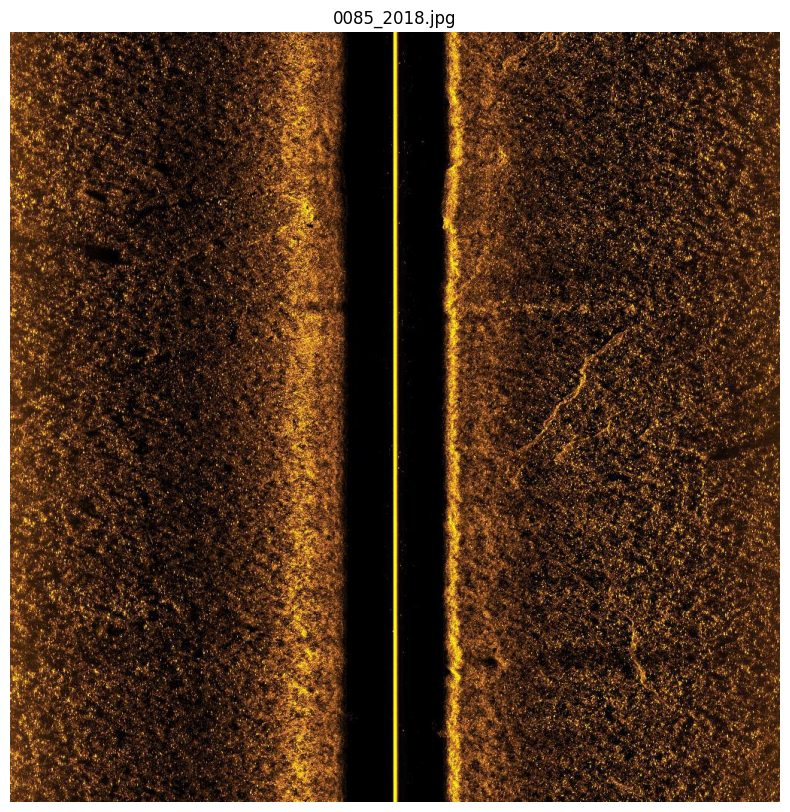

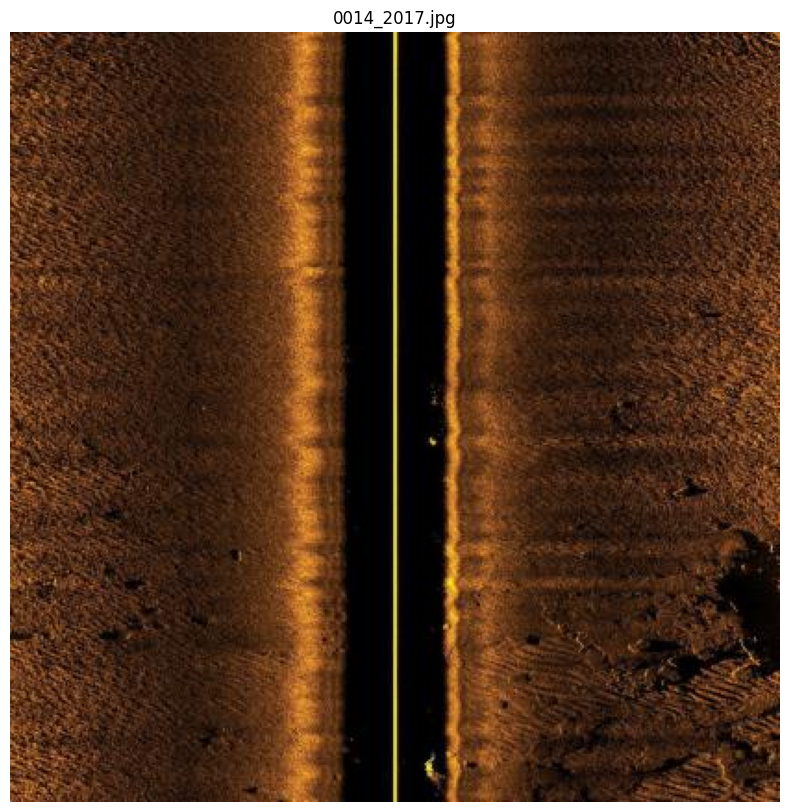

In [ ]:
def visualize_image(image_path, txt_path):
    if not os.path.isfile(image_path):
        print(f"Image file not found: {image_path}")
        return

    image = cv2.imread(image_path)
    if image is None:
        print(f"Unable to load image: {image_path}")
        return

    # Extract image name from image_path
    image_name = os.path.basename(image_path)

    # Convert BGR image to RGB for matplotlib
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image with bounding boxes
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.title(f"{image_name}")
    plt.axis('off')
    plt.show()

visualize_image('/content/data/all/0085_2018.jpg', '/content/data/all/0085_2018.txt')
visualize_image('/content/data/all/0014_2017.jpg', '/content/data/all/0014_2017.txt')
#visualize_image('/content/data/all/0001_2015.jpg', '/content/data/all/0001_2015.txt')

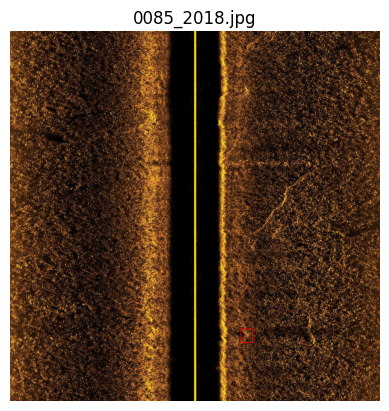

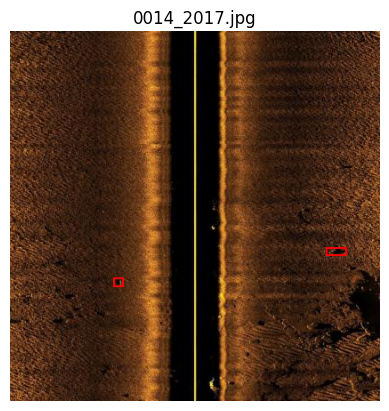

In [ ]:
def get_txt_file(image_filename, folder_path):
    """Retrieve and print the content of the .txt file corresponding to the image."""
    # Ensure the image file has an extension and replace it with '.txt'
    base_filename = os.path.splitext(image_filename)[0]
    txt_filename = f"{base_filename}.txt"
    txt_file_path = os.path.join(folder_path, txt_filename)

    # Check if the .txt file exists
    if os.path.exists(txt_file_path):
        # Read and print the contents of the .txt file
        with open(txt_file_path, 'r') as file:
            content = file.read()
        #print(f"Contents of {txt_filename}:\n{content}")
        return content  # Return the content if you want to use it programmatically
    else:
        print(f"No .txt file found for {image_filename}")
        return None

def visualize_bounding_boxes(image_filename, folder_path, bounding_boxes):
    """Visualize the image with bounding boxes."""
    image_path = os.path.join(folder_path, image_filename)

    if os.path.exists(image_path):
        with Image.open(image_path) as img:
            draw = ImageDraw.Draw(img)
            for bbox in bounding_boxes:
                # The bounding box format is assumed to be [class_id, center_x, center_y, width, height]
                class_id, center_x, center_y, norm_width, norm_height = bbox
                # Convert normalized coordinates to pixel values
                img_width, img_height = img.size
                x1 = int((center_x - norm_width / 2) * img_width)
                y1 = int((center_y - norm_height / 2) * img_height)
                x2 = int((center_x + norm_width / 2) * img_width)
                y2 = int((center_y + norm_height / 2) * img_height)

                # Draw the bounding box
                draw.rectangle([x1, y1, x2, y2], outline="red", width=2)

            # Display the image with bounding boxes
            plt.imshow(img)
            plt.axis('off')
            plt.title(image_filename)
            plt.show()
    else:
        print(f"No image file found for {image_filename} in {folder_path}")

def main(image_filename):
    """Main function to retrieve .txt file content and image dimensions."""
    # Get the .txt file content from the original directory
    txt_content = get_txt_file(image_filename, data_folder)

    # If the txt content exists, parse the bounding boxes
    if txt_content:
        bounding_boxes = []
        for line in txt_content.strip().split('\n'):
            bbox = list(map(float, line.split()))
            bounding_boxes.append(bbox)

        # Visualize the bounding boxes on the image
        visualize_bounding_boxes(image_filename, data_folder, bounding_boxes)

#main("0001_2015.jpg")
main("0085_2018.jpg")
main("0014_2017.jpg")

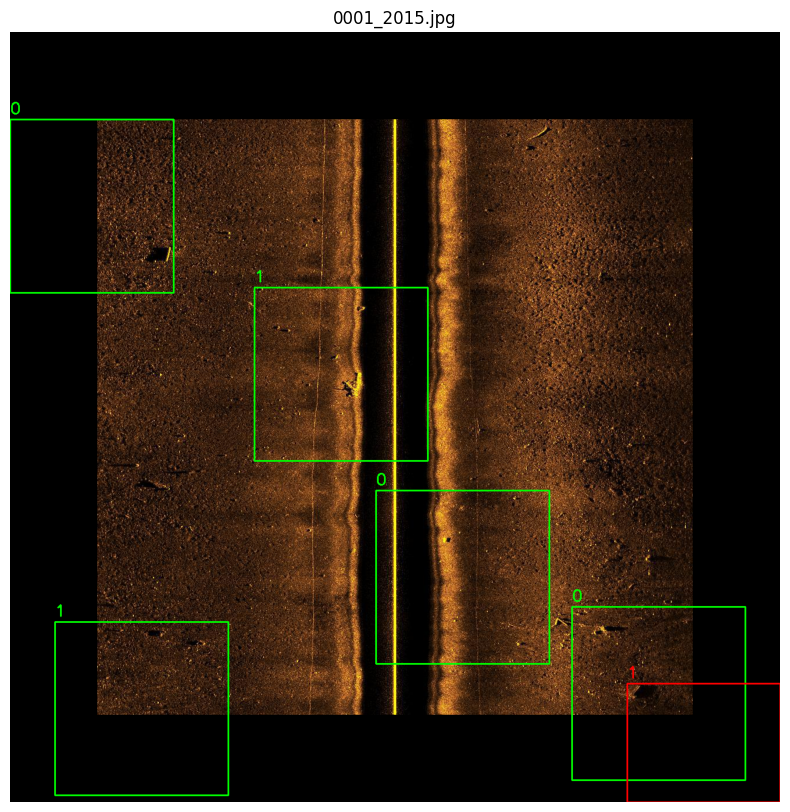

In [ ]:
visualize_bounding_boxes_with_padding('/content/data/all/0001_2015.jpg', '/content/data/all/0001_2015.txt')

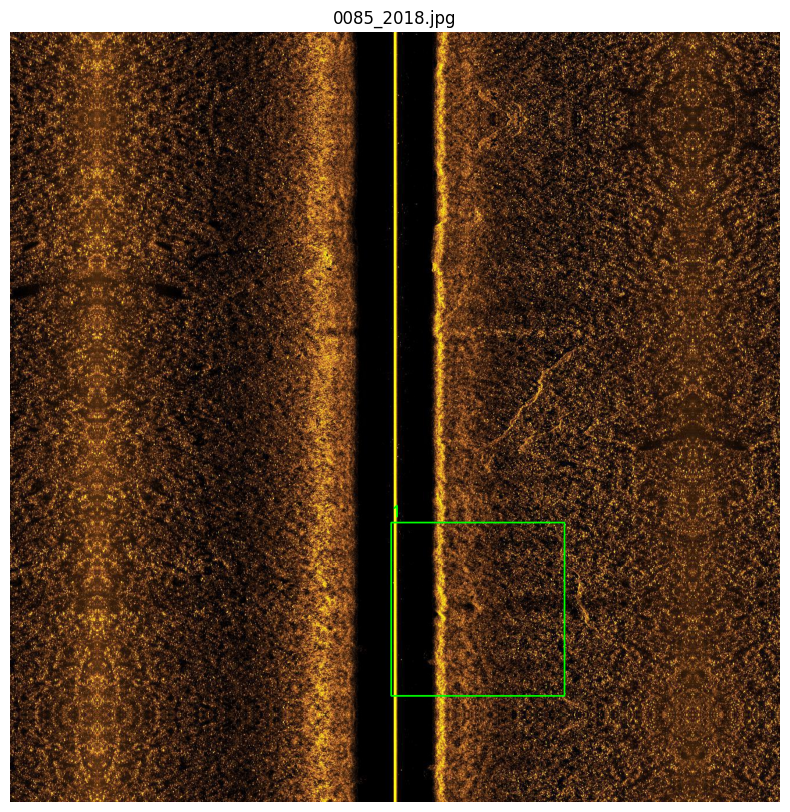

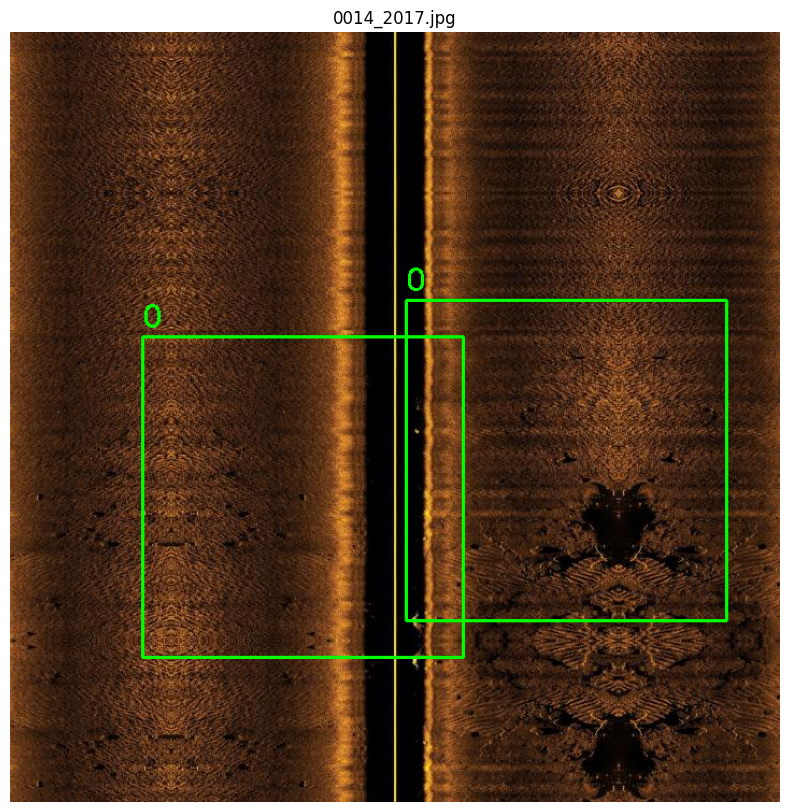

In [ ]:
#visualize_bounding_boxes_with_replicate_padding('/content/data/all/0001_2015.jpg', '/content/data/all/0001_2015.txt',iou_threshold=0.2)
visualize_bounding_boxes_with_replicate_padding('/content/data/all/0085_2018.jpg', '/content/data/all/0085_2018.txt',iou_threshold=0.2)
visualize_bounding_boxes_with_replicate_padding('/content/data/all/0014_2017.jpg', '/content/data/all/0014_2017.txt',iou_threshold=0.2)

# 3. Data refactoring
We start from a folder containing images with detections. In this section, each detection is extracted as a new image and resized to a size of 240x240 pixels.

In [ ]:
def calculate_iou(box1, box2):
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    inter_x_min = max(x1_min, x2_min)
    inter_y_min = max(y1_min, y2_min)
    inter_x_max = min(x1_max, x2_max)
    inter_y_max = min(y1_max, y2_max)

    inter_area = max(0, inter_x_max - inter_x_min) * max(0, inter_y_max - inter_y_min)
    box1_area = (x1_max - x1_min) * (y1_max - y1_min)
    box2_area = (x2_max - x2_min) * (y2_max - y2_min)
    union_area = box1_area + box2_area - inter_area

    iou = inter_area / union_area if union_area != 0 else 0

    return iou

def extract_and_save_crops(input_folder, output_folder, crop_size=299, padding=150, iou_threshold=0.1):
    """
    For each image (and its corresponding .txt file) in the input folder, extract 299x299 crops based on detections,
    filter out overlapping crops, and save the accepted crops to the output folder.

    Assumptions:
      - Each image is a JPEG file.
      - For each image, there is a corresponding txt file with the same base name.
      - Each txt file contains one detection per line in the format:
            class_id x y w h
        where x, y, w, h are normalized relative to the image dimensions.

    Parameters:
      input_folder: Path to the folder containing the images and txt files.
      output_folder: Path to the folder where the extracted crops will be saved.
      crop_size: The size (width and height in pixels) of the crop to extract (default is 299).
      padding: The number of pixels to pad around the original image using replicate padding.
    """

    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # List all JPEG images in the input folder.
    image_files = [f for f in os.listdir(input_folder) if f.lower().endswith('.jpg')]

    for image_file in image_files:
        image_path = os.path.join(input_folder, image_file)
        txt_path = os.path.join(input_folder, os.path.splitext(image_file)[0] + ".txt")

        # Check that the txt file exists.
        if not os.path.isfile(txt_path):
            print(f"Text file not found for image: {image_file}")
            continue

        # Load the image with OpenCV.
        image = cv2.imread(image_path)
        if image is None:
            print(f"Unable to load image: {image_path}")
            continue

        height, width, _ = image.shape
        # Add replicate padding.
        padded_image = cv2.copyMakeBorder(image, padding, padding, padding, padding, cv2.BORDER_REFLECT)
        padded_height, padded_width, _ = padded_image.shape

        detections = []

        # Parse detections from the text file.
        with open(txt_path, 'r') as file:
            for idx, line in enumerate(file.readlines()):
                values = line.strip().split()
                if len(values) != 5:
                    print(f"Unexpected parameters in {txt_path} at line {idx+1}. Skipping.")
                    continue
                # Parse normalized values.
                class_id, x, y, w, h = map(float, values)
                class_id = int(class_id)

                # Compute absolute center (before padding) and add padding.
                center_x = int(x * width) + padding
                center_y = int(y * height) + padding
                # Compute width and height in pixels.
                box_w = int(w * width)
                box_h = int(h * height)

                # Define crop boundaries so that the crop is centered at the detection center.
                half_crop = crop_size // 2
                x_min = max(center_x - half_crop, 0)
                y_min = max(center_y - half_crop, 0)
                x_max = min(center_x + half_crop, padded_width)
                y_max = min(center_y + half_crop, padded_height)

                detections.append((x_min, y_min, x_max, y_max, idx, class_id))

        # Filter overlapping detections.
        filtered_detections = []
        for det in detections:
            x_min, y_min, x_max, y_max, idx, class_id = det
            overlap = False
            for f_det in filtered_detections:
                fx_min, fy_min, fx_max, fy_max, _, _ = f_det
                iou = calculate_iou((x_min,y_min,x_max,y_max),(fx_min,fy_min,fx_max,fy_max))
                if iou > iou_threshold:
                  overlap = True
                  break
            if not overlap:
                filtered_detections.append(det)

        # Save the accepted (filtered) detections as cropped images.
        for det in filtered_detections:
            x_min, y_min, x_max, y_max, idx, class_id = det
            crop = padded_image[y_min:y_max, x_min:x_max]
            # If crop size is not exactly crop_size, you can optionally resize it.
            if crop.shape[0] != crop_size or crop.shape[1] != crop_size:
                crop = cv2.resize(crop, (crop_size, crop_size), interpolation=cv2.INTER_LINEAR)
            # Build an output file name. For example: originalImage_Idx_Class.jpg
            base_name = os.path.splitext(image_file)[0]
            out_filename = f"{base_name}_{idx}_{class_id}.jpg"
            out_path = os.path.join(output_folder, out_filename)
            cv2.imwrite(out_path, crop)
            print(f"Saved crop: {out_path}")

In [ ]:
extract_and_save_crops(data_folder, output_folder, iou_threshold=0.2)

Saved crop: /content/data/output/0269_2018_0_1.jpg
Saved crop: /content/data/output/0090_2015_0_1.jpg
Saved crop: /content/data/output/0090_2015_1_1.jpg
Saved crop: /content/data/output/0090_2015_2_0.jpg
Saved crop: /content/data/output/0090_2015_4_1.jpg
Saved crop: /content/data/output/0090_2015_5_0.jpg
Saved crop: /content/data/output/0010_2015_0_1.jpg
Saved crop: /content/data/output/0010_2015_3_0.jpg
Saved crop: /content/data/output/0010_2015_4_1.jpg
Saved crop: /content/data/output/0024_2015_0_0.jpg
Saved crop: /content/data/output/0443_2018_0_0.jpg
Saved crop: /content/data/output/0036_2015_0_0.jpg
Saved crop: /content/data/output/0213_2018_0_0.jpg
Saved crop: /content/data/output/0257_2010_0_0.jpg
Saved crop: /content/data/output/0371_2018_0_0.jpg
Saved crop: /content/data/output/0369_2018_0_0.jpg
Saved crop: /content/data/output/0456_2018_0_1.jpg
Saved crop: /content/data/output/0042_2015_0_0.jpg
Saved crop: /content/data/output/0365_2018_0_1.jpg
Saved crop: /content/data/outpu

In [ ]:
clear_folder(output_folder)

In [ ]:
count_images(output_folder)

Total number of images in '/content/data/output': 517


In [ ]:
show_random_images(output_folder, 517)

# 4. Data augmentation and data loader
This section augments the current data by zooming and shifting the current images. It also handles the data loader for the model.

In [ ]:
def tf_crop_center(image, crop_size):
    # Assumes image has shape (299, 299, 3)
    offset = (299 - crop_size) // 2
    return tf.image.crop_to_bounding_box(image, offset, offset, crop_size, crop_size)

def convert_to_grayscale(image):
    """Converts an RGB image tensor to grayscale."""
    grayscale_image = tf.image.rgb_to_grayscale(image)
    grayscale_image = tf.image.grayscale_to_rgb(grayscale_image)
    return grayscale_image

def apply_affine_transformation(image, theta=0, tx=0, ty=0, zx=1, zy=1, fill_mode='nearest'):
  """
      image: A NumPy array of shape (H, W, C) representing the image.
      theta: Rotation angle in degrees.
      tx: Horizontal translation in pixels.
      ty: Vertical translation in pixels.
      zx: Scaling factor along the x-axis.
      zy: Scaling factor along the y-axis.
      fill_mode: Border mode to use (e.g., 'nearest').
  """
  # Ensure the input is a numpy array
  image = np.asarray(image)

  # Get the image dimensions
  h, w, c = image.shape
  # Create a rotation matrix centered at the image center
  center = (w/2,h/2)
  M_rotation = cv2.getRotationMatrix2D(center,theta,1)

  # Incorporate translation into the transformation
  M_rotation[0,2] += tx
  M_rotation[1,2] += ty

  # For non-uniform scaling (zx, zy), create a separate scaling matrix
  M_scaling = np.array([[zx, 0, 0], [0, zy, 0]],dtype=np.float32)

  # Combine rotation and scaling
  # Convert M_rotation to a 3x3 homogeneous matrix
  M_rotation_h = np.vstack([M_rotation, [0,0,1]])
  # Create a 3x3 scaling matrix
  M_scaling_h = np.array([[zx,0,0],[0,zy,0],[0,0,1]],dtype=np.float32)
  # Combine the two transformations: first scale, then rotate and translate
  M_combined = M_rotation_h @ M_scaling_h # @ operator is matrix multiplication followed by assignment
  # Convert back to 2x3 matrix
  M = M_combined[:2,:]

  transformed = cv2.warpAffine(image,M,(w,h),flags=cv2.INTER_LINEAR,borderMode=cv2.BORDER_REPLICATE)
  return transformed

def numpy_augmentation(image_np):
    """Helper function for performing augmentations in NumPy (eager mode)."""
    # Apply small rotation (between -10 and 10 degrees)
    angle = np.random.uniform(-10.0, 10.0)  # Random angle between -10 and 10 degrees
    #image_np = apply_affine_transform(image_np, theta=angle, fill_mode='nearest'

    # Apply small translation (position shift)
    max_translation = 5  # max number of pixels to move
    tx = np.random.uniform(-max_translation, max_translation)
    ty = np.random.uniform(-max_translation, max_translation)

    # Apply small scaling (up or down by a small factor)
    scaling_factor = np.random.uniform(0.9, 1.1)  # Scale between 90% to 110% of original size
    #image_np = apply_affine_transform(image_np, zx=scaling_factor, zy=scaling_factor, fill_mode='nearest')

    transformed_image = apply_affine_transformation(image_np, theta=angle, tx=tx,ty=ty,zx=scaling_factor,zy=scaling_factor,fill_mode='nearest')

    return transformed_image

def augment_image(img_array):
    """Apply a series of augmentations to an image using TensorFlow."""
    # Convert to tensor for augmentation and scale to [0,1]
    image = tf.cast(img_array,tf.float32) / 255.0

    # Apply random flip (left-right and up-down)
    image = tf.image.random_flip_left_right(image)
    #image = tf.image.random_flip_up_down(image)

    # Apply random brightness and contrast adjustments
    image = tf.image.random_brightness(image, max_delta=0.2, )
    image = tf.image.random_contrast(image, lower=0.8, upper=1.2)

    # Get dynamic shape of the image
    original_size = tf.shape(image)[:2]  # This will return the height and width as a tensor

    # Use tf.py_function to perform augmentations in eager mode with NumPy
    image = tf.py_function(numpy_augmentation, [image], tf.float32)

    image.set_shape((299,299,3))

    # Ensure the image is in the range [0, 1] by clipping
    image = tf.clip_by_value(image, 0.0, 1.0)

    return image

def parse_image_filename(image_filename, CROP_SIZE):
    """Parse the filename to extract class label and bounding box index."""
    # Decode image_filename to string if necessary
    image_filename = image_filename.numpy().decode("utf-8")

    # Example filename: 0056_2015_1_0
    # New filename: 0319_2018_det0_class1.jpg
    match = re.match(r"(\d+_\d+)_(\d+)_([0-1]).jpg", image_filename)
    if match:
        image_id = match.group(1)  # "0056_2015"
        bbox_idx = int(match.group(2))  # Bounding box index
        class_label = int(match.group(3))  # Class (0 or 1)

    return image_id, bbox_idx, class_label

def create_data_loader(images, batch_size):
    """Create a TensorFlow data loader for cropped images and their class labels."""

    # List all the cropped image files (assuming they have the correct format)
    image_files = [f for f in os.listdir(images) if f.endswith('.jpg')]

    # Prepare the dataset from image files
    image_paths = [os.path.join(images, fname) for fname in image_files]

    # Create the dataset
    def _parse_image(image_path):
        """Load and preprocess image."""
        img = tf.io.read_file(image_path)
        img = tf.image.decode_jpeg(img, channels=3)  # Assuming JPEG format and 3 channels (RGB)

        CROP_SIZE = (299,299)

        # Extract class label and bounding box index from filename
        image_filename = tf.strings.split(image_path, os.path.sep)[-1]  # Extract the filename using TensorFlow's string functions
        _, _, class_label = tf.py_function(parse_image_filename, [image_filename, CROP_SIZE], [tf.string, tf.int32, tf.int32])

        class_label.set_shape(())


        # Apply augmentations
        img = augment_image(img)
        img = preprocess_input(img * 255.0)  # Scale back for preprocess_input

        # Set shape explicitly to avoid unknown shape issues
        img.set_shape((299, 299, 3))  # Image shape for InceptionResNetV2

        #img = tf_crop_image(img,input_size=299,crop_size=150)
        img = tf_crop_center(img, crop_size=240)
        #img = convert_to_grayscale(img)

        return img, class_label

    # Create the dataset
    dataset = tf.data.Dataset.from_tensor_slices(image_paths)

    count = 0
    for img_path in dataset:
        print(img_path.numpy().decode())
        count += 1
    print(f"Total images: {count}")

    # Map the function to load and augment images
    dataset = dataset.map(lambda x: _parse_image(x), num_parallel_calls=tf.data.experimental.AUTOTUNE)

    return dataset

## Data loader

Here Tensorflow creates a dataset where each element is a batch of images and their corresponding labels and original bounding boxes. During training, the model will receive these batches from the dataset.

In [ ]:
# Folder containing images like '0056_2015_5_0.jpg'
batch_size = 8
data_loader = create_data_loader(output_folder, batch_size)

/content/data/output/0339_2010_0_0.jpg
/content/data/output/0009_2021_2_0.jpg
/content/data/output/0077_2015_1_0.jpg
/content/data/output/0014_2015_2_1.jpg
/content/data/output/0056_2015_1_1.jpg
/content/data/output/0313_2010_0_1.jpg
/content/data/output/0256_2010_0_0.jpg
/content/data/output/0207_2010_0_0.jpg
/content/data/output/0035_2021_0_0.jpg
/content/data/output/0112_2015_2_0.jpg
/content/data/output/0079_2015_0_0.jpg
/content/data/output/0324_2010_0_0.jpg
/content/data/output/0080_2018_0_1.jpg
/content/data/output/0007_2015_6_0.jpg
/content/data/output/0001_2021_0_0.jpg
/content/data/output/0285_2018_0_1.jpg
/content/data/output/0445_2018_0_0.jpg
/content/data/output/0085_2018_0_1.jpg
/content/data/output/0053_2015_1_0.jpg
/content/data/output/0137_2018_0_0.jpg
/content/data/output/0118_2018_0_1.jpg
/content/data/output/0037_2018_0_0.jpg
/content/data/output/0065_2015_2_0.jpg
/content/data/output/0090_2015_0_1.jpg
/content/data/output/0039_2015_0_0.jpg
/content/data/output/0413

In [ ]:
for batch in data_loader.take(1):
  imgs, labels = batch
  #img, adjusted_bbox = inputs["image_input"], inputs["bbox_input"]
  print("Batch images shape:", imgs.shape)
  print("Batch labels:", labels)
  #print("Batch adjusted bboxes:", adjusted_bbox)

Batch images shape: (240, 240, 3)
Batch labels: tf.Tensor(0, shape=(), dtype=int32)


# 5. Training data preparation
This section prepares the data to align with the requirements of the models.


In [ ]:
dataset_count = sum(1 for _ in data_loader)
print("Number of images in main dataset:", dataset_count)

Number of images in main dataset: 517


In [ ]:
# Define split proportions
train_size = int(0.7 * dataset_count)  # 70% for training
val_size = int(0.15 * dataset_count) # 15% for validating
test_size = dataset_count - train_size - val_size  # 15% for testing

# Shuffle the data before splitting to ensure both sets are similar in distribution
data_loader = data_loader.shuffle(buffer_size=1000)

print(train_size)
print(val_size)
print(test_size)

# Split and batch the dataset
batch_size = 8
train_dataset = data_loader.take(train_size)
val_dataset = data_loader.skip(train_size).take(val_size)
test_dataset = data_loader.skip(train_size + val_size)

train_dataset = train_dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)

361
77
79


# 6. Model building
In this section some models are introduced.


### Model A

In [ ]:
# MODEL A
image_input = tf.keras.Input(shape=(240,240,3), name="image_input")

# Build the image branch using InceptionResNetV2 as a feature extractor
base_model = InceptionResNetV2(input_tensor=image_input, include_top=False, weights='imagenet')
base_model.trainable = False
x = base_model.output
# Add an upsampling layer to ensure adequate spatial dimensions for XAI methods
x = layers.UpSampling2D(size=(2, 2))(x)

# Convolution and pooling layers (with padding='same' to maintain spatial dimensions)
x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D(pool_size=(2, 2), padding='same')(x)

x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D(pool_size=(2, 2), padding='same')(x)

# Global average pooling and dense layers
x = layers.GlobalAveragePooling2D()(x) # Removes all spatial information, making Grad-CAM less useful
#x = layers.Flatten()(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.3)(x)

# Final classification layer
output = layers.Dense(2, activation='softmax')(x)

# Define the final model
model = models.Model(inputs=image_input, outputs=output)

# Compile the model
optimizer = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Check model summary
model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ image_input (InputLayer)  │ (None, 240, 240, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_820 (Conv2D)       │ (None, 119, 119, 32)   │            864 │ image_input[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_820   │ (None, 119, 119, 32)   │             96 │ conv2d_820[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_812            │ (None, 119, 119, 32)   │              0 │ batch_normalization_8… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_821 (Conv2D)       │ (None, 117, 117, 32)   │          9,216 │ activation_812[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_821   │ (None, 117, 117, 32)   │             96 │ conv2d_821[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_813            │ (None, 117, 117, 32)   │              0 │ batch_normalization_8… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_822 (Conv2D)       │ (None, 117, 117, 64)   │         18,432 │ activation_813[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_822   │ (None, 117, 117, 64)   │            192 │ conv2d_822[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_814            │ (None, 117, 117, 64)   │              0 │ batch_normalization_8… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_24          │ (None, 58, 58, 64)     │              0 │ activation_814[0][0]   │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_823 (Conv2D)       │ (None, 58, 58, 80)     │          5,120 │ max_pooling2d_24[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_823   │ (None, 58, 58, 80)     │            240 │ conv2d_823[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_815            │ (None, 58, 58, 80)     │              0 │ batch_normalization_8… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_824 (Conv2D)       │ (None, 56, 56, 192)    │        138,240 │ activation_815[0][0]   │
├──────────────────────

 Total params: 55,362,338 (211.19 MB)

 Trainable params: 1,025,218 (3.91 MB)

 Non-trainable params: 54,337,120 (207.28 MB)

### Model B

In [ ]:
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.optimizers import Adam

# Load base InceptionResNetV2 model without top classifier
base_model = InceptionResNetV2(include_top=False, weights='imagenet', input_shape=(240, 240, 3))

# Add custom classification head for binary output
x = base_model.output                     # Output of last conv layer
x = GlobalAveragePooling2D()(x)           # Apply GAP over spatial dimensions
x = Dense(2, activation='softmax')(x)     # Final output layer for binary classification

# Construct the full model
model = Model(inputs=base_model.input, outputs=x)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001),loss='sparse_categorical_crossentropy',metrics=['accuracy'])

# Check model summary
model.summary()

Model: "functional_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 240, 240, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1634 (Conv2D)      │ (None, 119, 119, 32)   │            864 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1634  │ (None, 119, 119, 32)   │             96 │ conv2d_1634[0][0]      │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1624           │ (None, 119, 119, 32)   │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1635 (Conv2D)      │ (None, 117, 117, 32)   │          9,216 │ activation_1624[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1635  │ (None, 117, 117, 32)   │             96 │ conv2d_1635[0][0]      │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1625           │ (None, 117, 117, 32)   │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1636 (Conv2D)      │ (None, 117, 117, 64)   │         18,432 │ activation_1625[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1636  │ (None, 117, 117, 64)   │            192 │ conv2d_1636[0][0]      │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1626           │ (None, 117, 117, 64)   │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_42          │ (None, 58, 58, 64)     │              0 │ activation_1626[0][0]  │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1637 (Conv2D)      │ (None, 58, 58, 80)     │          5,120 │ max_pooling2d_42[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1637  │ (None, 58, 58, 80)     │            240 │ conv2d_1637[0][0]      │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1627           │ (None, 58, 58, 80)     │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1638 (Conv2D) 

 Total params: 54,339,810 (207.29 MB)

 Trainable params: 54,279,266 (207.06 MB)

 Non-trainable params: 60,544 (236.50 KB)

### Training

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.utils import class_weight

callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
]

y_train = np.concatenate([labels.numpy() for _, labels in train_dataset], axis=0)

class_weights = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)

class_weights_dict = {i: weight for i, weight in enumerate(class_weights)}
print("Class weights:", class_weights_dict)

Class weights: {0: np.float64(0.7397540983606558), 1: np.float64(1.5427350427350428)}


In [ ]:
# Compute and directly save new model (CHANGE NAME)
history = model.fit(train_dataset, validation_data=val_dataset, epochs = 20,class_weight=class_weights_dict)
model_save_path = "/content/gdrive/MyDrive/UGent/2024-2025/MasterThesis/model_original_240.keras"
model.save(model_save_path)

In [ ]:
# Load old model
model_load_path = "/content/gdrive/MyDrive/UGent/2024-2025/MasterThesis/model_original_240_additionalLayers.keras" # Model A
#model_load_path = "/content/gdrive/MyDrive/UGent/2024-2025/MasterThesis/model_original_240.keras" # Model B
loaded_model = tf.keras.models.load_model(model_load_path)

In [ ]:
loaded_model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ image_input         │ (None, 240, 240,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_820 (Conv2D) │ (None, 119, 119,  │        864 │ image_input[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 119, 119,  │         96 │ conv2d_820[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_812      │ (None, 119, 119,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_821 (Conv2D) │ (None, 117, 117,  │      9,216 │ activation_812[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 117, 117,  │         96 │ conv2d_821[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_813      │ (None, 117, 117,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_822 (Conv2D) │ (None, 117, 117,  │     18,432 │ activation_813[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 117, 117,  │        192 │ conv2d_822[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_814      │ (None, 117, 117,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_24    │ (None, 58, 58,    │          0 │ activation_814[0… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_823 (Conv2D) │ (None, 58, 58,    │      5,120 │ max_pooling2d_24… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 58, 58,    │        240 │ conv2d_823[0][0]  │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_815      │ (None, 58, 58,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_824 (Conv2D) │ (None, 56, 56,    │    138,240 │ activation_815[0… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │        576 │ conv2d_824[0][0]  │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_816      │ (None, 56, 56,    │          0 │ batch_normalizat

 Total params: 57,412,776 (219.01 MB)

 Trainable params: 1,025,218 (3.91 MB)

 Non-trainable params: 54,337,120 (207.28 MB)

 Optimizer params: 2,050,438 (7.82 MB)

### Evaluation

In [ ]:
loaded_model = model

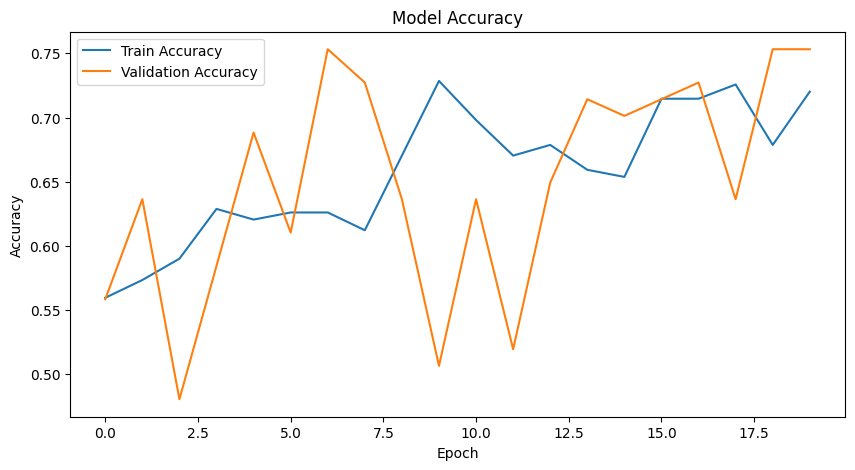

In [ ]:
# Plotting training & validation accuracy values
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='upper left')
plt.show()

In [ ]:
for batch in test_dataset.take(1):
  inputs, labels = batch
  predictions = loaded_model.predict(inputs)
  print("Predictions (class probabilities):")
  print(predictions)
  print("True labels:")
  print(labels.numpy())

1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
Predictions (class probabilities):
[[0.7171038  0.28289622]
 [0.5870511  0.41294897]
 [0.58104545 0.41895446]
 [0.9856368  0.01436318]
 [0.3061536  0.6938465 ]
 [0.45928106 0.540719  ]
 [0.4475428  0.5524572 ]
 [0.388952   0.611048  ]]
True labels:
[0 0 1 0 1 0 1 1]


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
Confusion matrix:
[[38 12]
 [ 7 22]]
Classification report:
              precision    recall  f1-score   support

           0       0.84      0.76      0.80        50
           1       0.65      0.76      0.70        29

    accuracy                           0.76        79
   macro avg       0.75      0.76      0.75        79
weighted avg       0.77      0.76      0.76        79



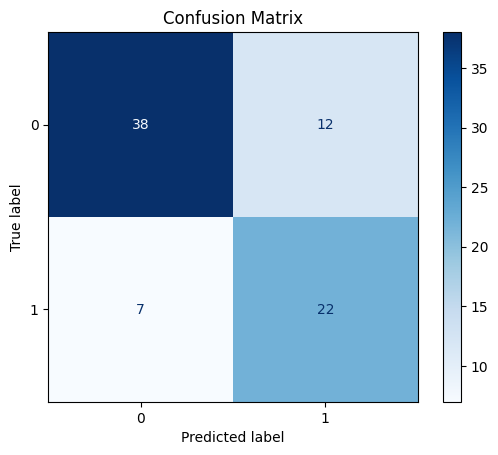

In [ ]:
# Get predictions and true labels from validation dataset
y_true = []
y_pred = []

# Iterate over the validation dataset
for batch in test_dataset:
  inputs, labels = batch # inputs: dict, labels : tensor
  # Make predictions
  predictions = loaded_model.predict(inputs)
  # Convert predictions (probabilities) to class indices
  predicted_classes = np.argmax(predictions, axis=1)
  # Append true and predicted labels
  y_true.extend(labels.numpy())
  y_pred.extend(predicted_classes)

y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred)
print("Confusion matrix:")
print(cm)

# Print classification report
print("Classification report:")
print(classification_report(y_true, y_pred))

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_true))
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


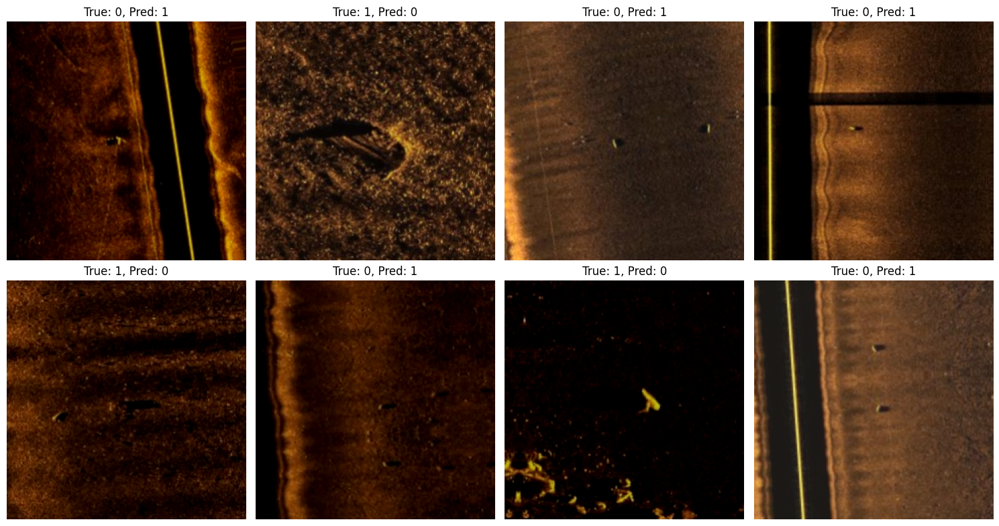

In [ ]:
# Collect misclassified samples in a list
misclassified_images = []
misclassified_true = []
misclassified_pred = []

# Iterate over the validation dataset
for batch in test_dataset:
  inputs, labels = batch
  preds = loaded_model.predict(inputs)
  predicted_classes = np.argmax(preds, axis=1)
  true_labels = labels.numpy()

  # Iterate over the batch
  for i in range(len(true_labels)):
    if predicted_classes[i] != true_labels[i]:
      misclassified_images.append(inputs[i].numpy())
      misclassified_true.append(true_labels[i])
      misclassified_pred.append(predicted_classes[i])

def deprocess_inception_resnet(image):
  image = (image + 1.0) * 127.5
  image = tf.clip_by_value(image,0,255)
  image = tf.cast(image,tf.uint8)
  return image

misclassified_images = [deprocess_inception_resnet(img) for img in misclassified_images]

num_to_show = min(8, len(misclassified_images))
if num_to_show == 0:
  print("No misclassified images found.")
else:
  plt.figure(figsize=(15,8))
  for idx in range(num_to_show):
    img = misclassified_images[idx]
    plt.subplot(2,4,idx+1)
    plt.imshow(img)
    plt.title(f"True: {misclassified_true[idx]}, Pred: {misclassified_pred[idx]}")
    plt.axis('off')
  plt.tight_layout()
  plt.show()